In [24]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import matplotlib as mpl
import numpy as np
import json
import requests
import seaborn as sns
#from tabulate import tabulate
cvemap = {}

mpl.rcParams['font.family'] = 'Times New Roman'
mpl.rcParams['font.size'] = 12

pd.set_option('display.max_rows', None)

header = {"Authorization": "Basic "+"QUlEMGNjYmQ2Yjg0YWFmNjJlZGY2NjY2NDUzY2QxYzdiNTg6MDI2OWIzYjZhMDEyMTgxYjM2MjA1YjhlZTNmNGFlNjE=",}

PATH="data/WiGLE_Backup.db"
PATH_MAP="data/cve-map_simple.json"
net = "network"
loc = "location"
WiWiFi="wigle_wifi"
WiBL="wigle_blue"
cve0="cve_basic"
cve1="cve_metrics_2"
cve2="cve_metrics_3"
cve3="cve_weaknesses"
keywords=['WiFi','wi-fi','wpa2','wpa','wpa3','wep','Extensible Authentication Protocol','Pre-Shared Key','Simultaneous Authentication of Equals','CCMP','TKIP','RobustmSecurity Network','Wi-Fi Protected Setup','hotspot',
         'IEEE 802.11','router','ip camera']

with open(PATH_MAP, 'r') as f:
    cvemap = json.load(f)

# vulnerabilities Analysis

In [25]:
# types
vulner_detail=[]
def vulner_type(keywords):
    con=sqlite3.connect(PATH)
    cur=con.cursor()
    
    types_dict_v2={"C":0,"I":0,"A":0}
    
    sql="select vectorString from {} where cve0.keywords='{}' and {}.id ={}.id".format(cve1,keywords,cve0,cve1)
    vecs=cur.execute(sql).fetchall()
    
    for vec in vecs:
        vs=vec.split('/')
        for i in range(1,len(vs)):
            if vs.split(":")[1]!='N':
                types_dict_v2[vs.split(":")[0]]+=1
                
    
    types_dict_v3={"C":0,"I":0,"A":0}
    
    sql="select vectorString from {} where cve0.keywords='{}' and {}.id ={}.id".format(cve2, keywords,cve0,cve2)
    vecs=cur.execute(sql).fetchall()
    
    for vec in vecs:
        vs=vec.split('/')
        for i in range(6,len(vs)):
            if vs.split(":")[1]!='N':
                types_dict_v3[vs.split(":")[0]]+=1
    con.close()
    return [types_dict_v2,type_dict_v3]



    
def vulner_risk_level(keywords):
    con=sqlite3.connect(PATH)
    cur=con.cursor()
    
    sql="select impactScore,count(*) from {} where {}.keywords='{}' and {}.id ={}.id gourp by impactScore".format(cve1,cve0,keywords,cve0,cve1)
    rts=cur.execute(sql).fetechall()
    print(rts)
    
    sql="select impactScore,count(*) from {} where {}keywords='{}' and cve0.keywords='{}' and {}.id ={}.id gourp by impactScore".format(cve2,cve0,keywords,cve0,cve2)
    rts=cur.execute(sql).fetechall()
    print(rts)
    
    con.close()
    
ULW_P=["EUROPE","BEIJING","SHENZHEN","AMERICA","SICHUAN","HUI","ZHOU","Hong","KONG","SHANGHAI","ASIA","CH","USA","BELGIUM",
       "ZHUHAI","GUANGZHOU"]# useless word-place
ULW_S=["COMPUTER","SYSTEMS","CO","LTD","LIMITED","CORPORATION","CORP","COMMUNCATIONS","COMMUNICATION","COMMUNICATIONS","ELECTRONIC","ELECTRONICS",
       "NETWORK","INC","LLC","COMPANY","INTERNATIONAL","WIRELESS","DATA","MEDICAL","AG","Electric","NETWORKING","ELECTRIC",
       "SRO","BV","SYS","INDUSTRIALS","INDUSTRIAL","DEVICE","DEVICES","COMM","TECHNOLOGY","TECHNOLOGIES","TECH","COLTD","A/S","DELIVERY","NV",
       "NETWORKS","APPLICATIONS","OF","APS","GROUP","IND","DEVELOPMENT","AS","AB","OY","IOT","INNOTEK","GMBH","AUDIOVISUELLES",
       "MARKETING","UND","COMPUTERSYSTEME","MACHINE","ELECTRO","MECHANICS","MOBILE","SOFTWARE","DIGITAL","TECHLTD","INFORMATION",
      "AUTOMOTIVE","CORPORATE","ENTERPRISE","LABORATORY","LABORATORIES"] # useless word-suffix
def clean_name(vendors):
    vens=[]
    vendors=list(vendors)
 
    for vendor in vendors:
        rt=vendor.replace(",","").replace(".","").replace("\n","").replace("，","").replace("'","")
        rt_s=rt.split(" ")
        if rt_s[0]=="Harman/Becker":
            name=["Harman"]
        elif rt_s[0]=="Nokia":
            name=["Nokia"]
        else:
            name=[r for r in rt_s if r.upper() not in ULW_P and r.upper() not in ULW_S and "(" not in r and ")" not in r]
        #print(name)
        if name!=[]:
            vens.append(name[0].lower())
   
    return vens

# analyze vendor distribution

In [15]:
def vendor(df,title):
    other_count = df.loc[df.index > 7, 'count(*)'].sum()
    df.loc[7, 'OrganizationName'] = 'Other'
    df.loc[7, 'count(*)'] = other_count
    df = df.loc[df.index < 7]
    print(df)
    label=["Cisco","NETGEAR","ZyGate","Global Sun","Sagemcom","Intel","Ubiquiti"]
    plt.figure(figsize=(8, 8))
    _, _, autotexts =plt.pie(df['count(*)'],autopct='%1.1f%%', textprops={"fontsize": 14})
    for i, autotext in enumerate(autotexts):
        autotext.set_text(label[i]+"\n"+str(autotext.get_text()))
    
    plt.show()

    

These devices belong to 285 companies
                                      OrganizationName  count(*)
0                                 Cisco Systems, Inc\n      5054
1                                            NETGEAR\n      3729
2                        ZyGate Communications, Inc.\n      3700
3                        Global Sun Technology, Inc.\n      2689
4                             Sagemcom Broadband SAS\n      2611
5                                  Intel Corporation\n      2297
6                                       Ubiquiti Inc\n      1996
7                                            Philips\n      1621
8                              ASUSTek COMPUTER INC.\n      1434
9                                        Apple, Inc.\n      1426
10                                     Agere Systems\n      1220
11                                SMC Networks, Inc.\n      1158
12                           The Linksys Group, Inc.\n      1067
13                        Billion Electric Co., Ltd.

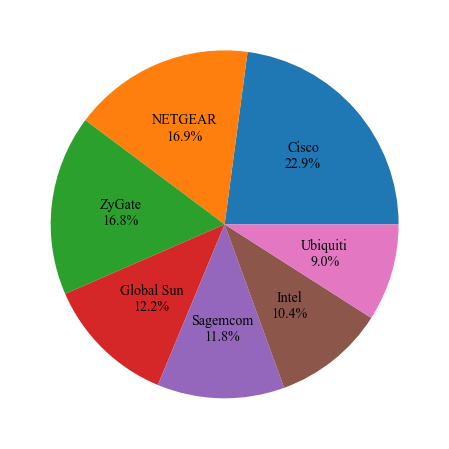

In [16]:
# Define the SQL query
conn = sqlite3.connect(PATH)
cur=conn.cursor()

# Execute the query and store the results in a pandas DataFrame
query = """
        SELECT vendor.OrganizationName, count(*)
        FROM vendor
        JOIN (
            SELECT bssid 
            FROM network 
            WHERE type = 'W'
            UNION ALL 
            SELECT netid 
            FROM wigle_wifi
        ) AS network_wifi ON network_wifi.bssid = vendor.mac
        GROUP BY vendor.OrganizationName
        ORDER BY count(*) DESC
        """
df = pd.read_sql_query(query, conn)
print('These devices belong to {} companies'.format(df.shape[0]))

# Statistic the vendor distribution of WiFi devices


# Statistic the vendor distribution of BT devices



# Close the database connection
conn.close()

# Print the DataFrame
print(df)
vendor(df,"WiFi Vendors")

# analyze WiFi protocol, authentication protocol, ciper

In [25]:
conn = sqlite3.connect(PATH)
cur=conn.cursor()
sql="select capabilities from {} where type='W'".format(net)
encry=cur.execute(sql).fetchall()
print("There are {} WiFi data exported from android WiGLE".format(len(encry)))

# print("--------invoke API to find Open WiFi")
# with open('data/Open_WiFi.json','r') as f:
#     file=json.load(f)
# sql="SELECT bssid from network WHERE type='W' and capabilities NOT like '%WPA%' and capabilities NOT like '%WPA2%' and capabilities NOT like '%WPA%' and capabilities NOT like '%WPA3%' and capabilities NOT like '%WEP%' and capabilities NOT like '%RSN%'"
# bssid_unknown=cur.execute(sql).fetchall()
# keys=file.keys()
# url_wifi_details="https://api.wigle.net/api/v2/network/detail?netid={}"
# unknown_data={}
# for bssid in bssid_unknown:
#     if bssid in keys:
#         continue
#     bid=bssid[0]
#     url=url_wifi_details.format(bid.replace(":","%3A"))
#     print(url)
#     response=requests.get(url,headers=header)
#     result=response.json()
#     if result['success']==True:
#         print(result["results"][0].get('encryption'))
#         file[bid]=result["results"][0].get('encryption')

# DB export from android
protocols_list=['WPA2','WPA','WEP']
authes_list=['SHA256','SHA128','EAP','PSK','OSEN','CERT','PSK','EAP','PSK','SAE']
ciphers_list = ['CCMP','TKIP','GCMP','SMS','None']
protocols_1={}
authes_keys = {}
ciphers = {}
others = {}

def addToDict(key,myDicts):
    if key not in myDicts:
        myDicts[key]=1
    else:
        myDicts[key]+=1

        
# open_wifi_num=0
# for key in file.keys():
#     if file[key]=='none':
#         open_wifi_num+=1
#     if c in protocols_list:
#         addToDict(c,protocols_1)
        
wpa_tk=0
for e in encry:
    #print(e[0])
    capabilities=e[0].split('[')
    for capability in capabilities:
        #print(capability)
        capability=capability[:-1]
        if "-" in capability:
            capa = capability.split("-")
            for c in capa:
                if c=='':
                    continue
                key0 = c.split('+')[0].split('/')[0]
                if key0 in protocols_list:
                    if key0=='WPA' and 'TKIP' in capability:
                        wpa_tk+=1
                    addToDict(c,protocols_1)
                elif key0 in authes_list:
                    addToDict(c,authes_keys)
                elif key0 in ciphers_list:
                    addToDict(c,ciphers)
                else:
                    addToDict(c,others)
        else:
            c=capability
            if c=='':
                continue
            if c=='RSN':
                c='WPA2'
            if c in protocols_list:
                addToDict(c,protocols_1)
            elif c in authes_list:
                addToDict(c,authes_keys)
            elif c in ciphers_list:
                addToDict(c,ciphers)
            else:
                addToDict(c,others)

                
print("---------protocols-----------")
print(protocols_1)
print("---------key mgmt-----------")
print(authes_keys)
print("---------cipher-----------")
print(ciphers)
print("---------others-----------")
print(others)
print("---------WPA-TKIP-----------")
print(wpa_tk)
conn.close()

There are 53922 WiFi data exported from android WiGLE
---------protocols-----------
{'WPA2': 47755, 'WPA': 3702, 'WEP': 160}
---------key mgmt-----------
{'EAP/SHA1': 9313, 'PSK': 86781, 'PSK+SAE': 672, 'EAP/SHA1+FT/EAP': 738, 'PSK+FT/PSK': 1416, 'SAE': 62, 'EAP/SHA1+?': 79, 'PSK+PSK': 162, 'SHA256': 140, 'EAP/SHA1+EAP/SHA256': 32, 'SHA256+SAE': 34, 'PSK+FT/PSK+SAE+FT/SAE': 9, 'EAP/SHA256': 2, 'EAP/SHA1+?+FT/EAP': 8}
---------cipher-----------
{'CCMP': 90389, 'TKIP+CCMP': 2889, 'CCMP+TKIP': 5465, 'TKIP': 425, 'None+CCMP': 124}
---------others-----------
{'RSN': 47841, 'ESS': 53820, 'WPS': 23452, 'MFPC': 713, 'MFPR': 12, 'IBSS': 17, 'Mis': 6, 'Uncategorized;1': 7, 'OWE_TRANSITION': 16, 'OWE': 8}
---------WPA-TKIP-----------
2935


In [ ]:
with open('data/Open_WiFi.json', 'w') as f:
    f.dump(file)

In [26]:
#DB from WiGLE API
conn = sqlite3.connect(PATH)
cur=conn.cursor()

sql="select encryption,count(*) from {} group by encryption ".format(WiWiFi)
encry=cur.execute(sql).fetchall()
print("There are {} WiFi data exported from WiGLE API".format(len(encry)))

protocols_2=encry
protocols={}
sum=0
for pro in protocols_2:
    print(pro)
    if protocols_1.get(pro[0].upper())==None:
        protocols[pro[0].upper()]=pro[1]
    else:
        protocols[pro[0].upper()]= pro[1] + protocols_1[pro[0].upper()]
    sum+=protocols[pro[0].upper()]
    print(protocols[pro[0].upper()])
print(sum)
conn.close()



There are 6 WiFi data exported from WiGLE API
('none', 13463)
13463
('unknown', 17998)
17998
('wep', 8292)
8452
('wpa', 3629)
7331
('wpa2', 96525)
144280
('wpa3', 219)
219
191743


{'NONE': 13463, 'UNKNOWN': 17998, 'WEP': 8452, 'WPA': 7331, 'WPA2': 144280, 'WPA3': 219}


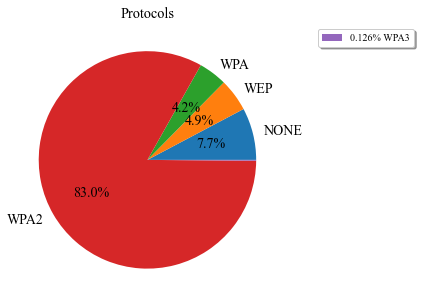

{'EAP/SHA1': 9313, 'PSK': 86781, 'PSK+SAE': 672, 'EAP/SHA1+FT/EAP': 738, 'PSK+FT/PSK': 1416, 'SAE': 62, 'EAP/SHA1+?': 79, 'PSK+PSK': 162, 'SHA256': 140, 'EAP/SHA1+EAP/SHA256': 32, 'SHA256+SAE': 34, 'PSK+FT/PSK+SAE+FT/SAE': 9, 'EAP/SHA256': 2, 'EAP/SHA1+?+FT/EAP': 8}


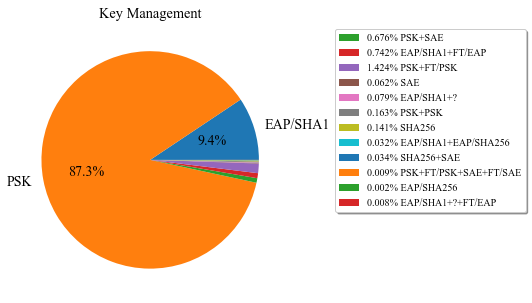

{'CCMP': 90389, 'TKIP+CCMP': 2889, 'CCMP+TKIP': 5465, 'TKIP': 425, 'None+CCMP': 124}


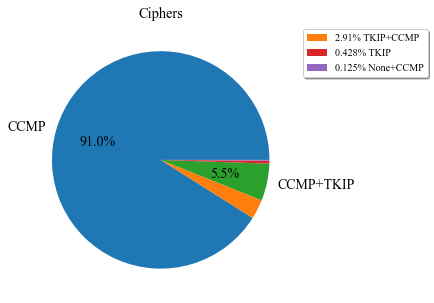

In [34]:
import matplotlib.pyplot as plt
dicts=[protocols,authes_keys,ciphers]
dicts_name=["Protocols","Key Management","Ciphers"]
threshold = 0.04
# Create a pie chart
ii = 0
for i,di in enumerate(dicts):
    
    print(di)
    dii=di
    if i == 0:
        del dii['UNKNOWN']
    
    plt.figure(figsize=(5, 5))
    wedges, texts, autotexts=plt.pie(dii.values(), labels=list(dii.keys()), autopct='%1.1f%%', textprops={"fontsize": 14},labeldistance=1.1)
    #ax.set_title("Fruit Distribution")
    #print(wedges, "\n",texts,  "\n",autotexts)
    # 添加图例
    legend_data = [d for d in di.values() if (d/sum(di.values()) < threshold)]
    if legend_data:
        legend_labels=[]
        legend_colors=[]
        for wedge,t,a,j in zip(wedges,texts,autotexts,range(len(di.values()))):
            if di[list(di.keys())[j]]/sum(di.values()) < threshold:
                legend_labels.append(f"{round(di[t.get_text()]/sum(di.values()) * 100, 3)}% {t.get_text()}")
                legend_colors.append(wedge.get_facecolor())
                t.set_text('')
                a.set_text('')
                
        
        if ii ==0 or ii==2:       
        #legend_colors = [colors[i] for i, d in enumerate(di.values()) if (d/sum(di.values()) < 0.05)]
            leg = plt.legend( labels=legend_labels, loc='upper right', bbox_to_anchor=(1.5, 1), ncol=1, prop={'size': 10}, fancybox=True, shadow=True, framealpha=1)
            for j in range(len(legend_colors)):
                leg.get_patches()[j].set_facecolor(legend_colors[j])
        else:
            leg =plt.legend(legend_labels, loc='upper right', bbox_to_anchor=(1.9, 1), ncol=1, prop={'size': 10}, fancybox=True, shadow=True)
            for j in range(len(legend_colors)):
                leg.get_patches()[j].set_facecolor(legend_colors[j])
        ii+=1
    #print(i)
    plt.title(dicts_name[i])
    plt.show()


In [83]:
for text, autotext in zip(texts, autotexts):
    print(f"text: {text.get_text()}, autotext: {autotext.get_text()}")


text: WPA2, autotext: 48.2%
text: RSN, autotext: 48.2%
text: WPA, autotext: 3.5%
text: WEP, autotext: 0.1%


# analyze channel

# free WiFi

In [35]:
import matplotlib.pyplot as plt
conn = sqlite3.connect(PATH)
cur=conn.cursor()

sql="SELECT freenet, count(freenet)as count from wigle_wifi GROUP by freenet"

rts_number = cur.execute(sql).fetchall()
print(rts_number)


y=[]
x=[]
for rt in rts:
    x.append(rt[0])
    y.append(rt[1])

sql="SELECT ssid, netid,type,comment, wep,bcninterval, dhcp, paynet,channel,encryption from wigle_wifi WHERE freenet='Y'"
rts_free_info=cur.execute(sql).fetchall()
for rt in rts_free_info:
    print(rt)

conn.close()

[('?', 69805), ('N', 8), ('Y', 69)]
('Free Cafe Runddelen', '00:02:72:8B:4F:01', 'infra', 'None', 'W', '0', '?', '?', '11', 'wpa')
('Wayport_Access', '00:04:23:82:BE:AB', 'probe', 'None', '?', '0', '?', 'Y', '0', 'unknown')
('Free Public WiFi', '00:04:23:92:2B:EC', '????', 'None', '?', '0', '?', '?', '0', 'unknown')
('Generator Free WiFi', '00:04:96:55:B0:B2', 'infra', 'None', '?', '0', '?', '?', '1', 'unknown')
('Generator Free WiFi', '00:04:96:56:2C:A2', 'infra', 'None', 'N', '0', '?', '?', '6', 'none')
('Generator Free WiFi', '00:04:96:56:2D:F2', 'infra', 'None', '?', '0', '?', '?', '6', 'unknown')
('Generator Free WiFi', '00:04:96:56:2E:D2', 'infra', 'None', '?', '0', '?', '?', '1', 'unknown')
('Daphix Test', '00:04:96:56:35:B2', 'infra', 'None', '?', '0', '?', '?', '11', 'unknown')
('Generator Free WiFi', '00:04:96:56:38:52', 'infra', 'None', '?', '0', '?', '?', '11', 'unknown')
('Generator Free WiFi', '00:04:96:56:38:62', 'infra', 'None', '?', '0', '?', '?', '11', 'unknown')
('Ge

In [42]:
conn = sqlite3.connect(PATH)
cur=conn.cursor()

sql="SELECT netid, encryption FROM wigle_wifi WHERE freenet='Y' and encryption!='unknown' and encryption!='none'"
rts_free_encryp=cur.execute(sql).fetchall()
for rt in rts_free_encryp:
    print(rt)

sql="SELECT encryption, count(encryption) FROM wigle_wifi WHERE freenet='Y' GROUP by encryption"
rts_free_encryp_ana=cur.execute(sql).fetchall()
print("\n\nStatistic of free network encryption:")
for rt in rts_free_encryp_ana:
    print(rt)
conn.close()

('00:02:72:8B:4F:01', 'wpa')
('00:04:E2:8B:1E:48', 'wep')
('00:04:ED:5E:CE:07', 'wep')
('00:02:CF:92:29:08', 'wep')
('00:02:CF:99:A0:E6', 'wpa2')
('04:18:D6:21:6D:39', 'wpa2')
('04:18:D6:22:6D:39', 'wpa2')
('06:18:0A:6F:10:F7', 'wpa2')
('06:18:1A:6F:10:F7', 'wpa2')
('06:18:1A:6F:66:69', 'wpa2')
('06:18:D6:E7:A1:FE', 'wpa2')
('06:18:D6:E7:A3:67', 'wpa2')


Statistic of free network encryption:
('none', 19)
('unknown', 38)
('wep', 3)
('wpa', 1)
('wpa2', 8)


# vendor vulenerbabilities

In [7]:
ULW_P=["EUROPE","BEIJING","SHENZHEN","AMERICA","SICHUAN","HUI","ZHOU","Hong","KONG","SHANGHAI","ASIA","CH","USA","BELGIUM",
       "ZHUHAI","GUANGZHOU"]# useless word-place
ULW_S=["COMPUTER","SYSTEMS","CO","LTD","LIMITED","CORPORATION","CORP","COMMUNCATIONS","COMMUNICATION","COMMUNICATIONS","ELECTRONIC","ELECTRONICS",
       "NETWORK","INC","LLC","COMPANY","INTERNATIONAL","WIRELESS","DATA","MEDICAL","AG","Electric","NETWORKING","ELECTRIC",
       "SRO","BV","SYS","INDUSTRIALS","INDUSTRIAL","DEVICE","DEVICES","COMM","TECHNOLOGY","TECHNOLOGIES","TECH","COLTD","A/S","DELIVERY","NV",
       "NETWORKS","APPLICATIONS","OF","APS","GROUP","IND","DEVELOPMENT","AS","AB","OY","IOT","INNOTEK","GMBH","AUDIOVISUELLES",
       "MARKETING","UND","COMPUTERSYSTEME","MACHINE","ELECTRO","MECHANICS","MOBILE","SOFTWARE","DIGITAL","TECHLTD","INFORMATION",
      "AUTOMOTIVE","CORPORATE","ENTERPRISE","LABORATORY","LABORATORIES"] # useless word-suffix
def clean_name(vendors):
    vens=[]
    vendors=list(vendors)
 
    for vendor in vendors:
        rt=vendor.replace(",","").replace(".","").replace("\n","").replace("，","").replace("'","")
        rt_s=rt.split(" ")
        if rt_s[0]=="Harman/Becker":
            name=["Harman"]
        elif rt_s[0]=="Nokia":
            name=["Nokia"]
        else:
            name=[r for r in rt_s if r.upper() not in ULW_P and r.upper() not in ULW_S and "(" not in r and ")" not in r]
        #print(name)
        if name!=[]:
            vens.append(name[0].lower())
   
    return vens

In [27]:
con=sqlite3.connect(PATH)
cur=con.cursor()

sql="""SELECT DISTINCT capabilities, vendor.OrganizationName,count(*)
        FROM vendor,(
            SELECT bssid as netid, capabilities
            FROM network 
            WHERE type = 'W'
        ) AS network_wifi
        WHERE network_wifi.netid = vendor.mac
        GROUP BY vendor.OrganizationName
        ORDER BY count(*) DESC
        """
df=pd.read_sql_query(sql, con)
#display(df)
print("---------","clean capabilities","-----------")
display(df)

--------- clean capabilities -----------


,capabilities,OrganizationName,count(*)
0,[WPA2-EAP/SHA1-CCMP][RSN-EAP/SHA1-CCMP][ESS],"Cisco Systems, Inc\n",3325
1,[WPA2-PSK-CCMP][RSN-PSK-CCMP][ESS][WPS],Sagemcom Broadband SAS\n,2611
2,[WPA2-PSK-CCMP][RSN-PSK-CCMP][ESS],Ubiquiti Inc\n,547
3,[WPA2-PSK-CCMP][RSN-PSK-CCMP][ESS][WPS],"TP-LINK TECHNOLOGIES CO.,LTD.\n",434
4,[WPA2-PSK-CCMP][RSN-PSK-CCMP][ESS],"Huawei Device Co., Ltd.\n",362
...,...,...,...
162,[WPA-PSK-TKIP][ESS],Belkin Corporation\n,1
163,[WPA2-PSK-CCMP][RSN-PSK-CCMP][ESS],"Actions Microelectronics Co., Ltd\n",1
164,[WPA-PSK-TKIP+CCMP][WPA2-PSK-TKIP+CCMP][RSN-PS...,"AMIT, Inc.\n",1
165,[ESS],AIRTAME ApS\n,1


In [28]:
"""
find those cve of a vendor which is used the most
"""
MAX_SHOWN_VENDOR=8-1
capa_cve={}
overview=pd.DataFrame()
unique_vendors=df['OrganizationName'].unique()
vendors=clean_name(unique_vendors)
print(vendors)
rts={}
for i in range(len(vendors)):
    # collect all the severity and weakness according to cve_metrics_2
    sql="""SELECT baseSeverity, cve_weaknesses.description_value,vulnStatus,published
                from cve_metrics_2,cve_weaknesses(
                SELECT id,vulnStatus,published from cve_basic where keywords='{}'
                )AS basic
                WHERE basic.id=cve_metrics_2.id and cve_weaknesses.id=basic.id""".format(vendors[i])
    df_vendor=pd.read_sql_query(sql, con)
    rts[vendors[i]]=df_vendor
    print(rts,"\n")
    overview=pd.concat([overview,df_vendor])

['cisco', 'sagemcom', 'ubiquiti', 'tp-link', 'huawei', 'asustek', 'netgear', 'ruckus', 'kaonmedia', 'aruba', 'huawei', 'tp-link', 'd-link', 'zyxel', 'airties', 'jensen', 'google', 'hewlett', 'icotera', 'belkin', '3d', 'apple', 'hewlett', 'technicolor', 'murata', 'continental', 'extreme', 'zte', 'alpsalpine', 'teltonika', 'securitas', 'tenda', 'wistron', 'mist', 'routerboardcom', 'inteno', 'cisco', 'traficon', 'quantenna', 'seiko', 'cisco-linksys', 'visteon', 'qcom', 'pittasoft', 'eero', 'securitas', 'genexis', 'pepwave', 'fortinet', 'samsung', 'hon', 'xiaomi', 'arlo', 'u-blox', 'texas', 'nokia', 'delta', 'z-com', 'open', 'hp', 'garmin', 'edimax', 'ampak', 'actia', 'bilian', 'gree', 'engenius', 'actia', 'tenda', 'senao', 'samsung', 'realtek', 'quectel', 'qisda', 'nova', 'linksprite', 'lancom', 'genexis', 'frontier', 'edup', 'bluegiga', 'baudtec', 'ewpe', 'xiaomi', 'technicolor', 'smart', 'skyworth', 'rf-link', 'panasonic', 'gaoshengda', 'harman', 'juan', 'gainspan', 'gl', 'ford', 'azure

1       MEDIUM            CWE-22   Analyzed  2020-06-22T13:15:12.427} 

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12      

Index: []} 

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.0

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

3         HIGH            CWE-20   Analyzed  2019-04-11T21:29:00.797} 

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12      

Index: []} 

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.0

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

1       MEDIUM           CWE-200   Analyzed  2012-01-25T04:03:27.580} 

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12      

Index: []} 

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.0

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

Index: []} 

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.0

Index: []} 

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.0

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

Index: []} 

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.0

17         HIGH           CWE-255   Modified  2016-01-22T11:59:07.227} 

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12     

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

Index: []} 

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.0

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

45       MEDIUM           CWE-120   Analyzed  2019-08-09T18:15:11.320} 

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12     

Index: []} 

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.0

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

Index: []} 

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.0

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

{'cisco':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
1        MEDIUM           CWE-787   Analyzed  2021-02-24T20:15:13.473
2           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
3           LOW            CWE-20   Modified  2018-10-17T19:29:00.303
4          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
5          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
6          HIGH            CWE-77   Analyzed  2019-05-16T17:29:01.277
7          HIGH            CWE-88   Analyzed  2019-05-16T17:29:01.277
8        MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
9        MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
10       MEDIUM           CWE-400   Analyzed  2019-10-02T19:15:13.810
11       MEDIUM     NVD-CWE-Other   Analyzed  2019-10-02T19:15:13.810
12         HIGH            CWE-78   Analyzed  2020-02-26T17:15:13.047
13        

In [10]:
overview

,baseSeverity,description_value,vulnStatus,published
0,HIGH,CWE-119,Analyzed,2019-07-01T15:15:12.227
1,HIGH,CWE-119,Analyzed,2019-07-01T15:15:12.227
2,MEDIUM,CWE-326,Analyzed,2019-07-01T15:15:12.117
3,MEDIUM,CWE-326,Analyzed,2019-07-01T15:15:12.117
4,HIGH,CWE-119,Analyzed,2019-07-01T15:15:12.803
...,...,...,...,...
13,MEDIUM,CWE-78,Analyzed,2019-05-15T18:29:00.390
14,HIGH,CWE-255,Modified,2016-01-22T11:59:03.850
15,HIGH,CWE-255,Modified,2016-01-22T11:59:03.850
16,HIGH,CWE-255,Modified,2016-01-22T11:59:07.227


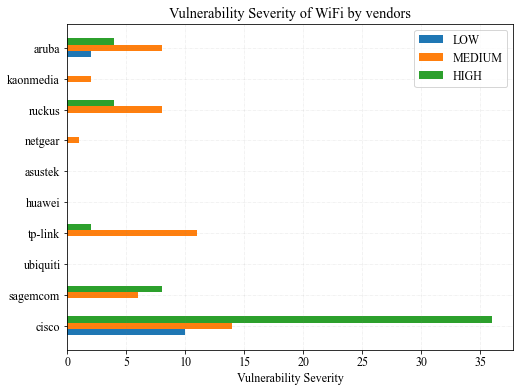

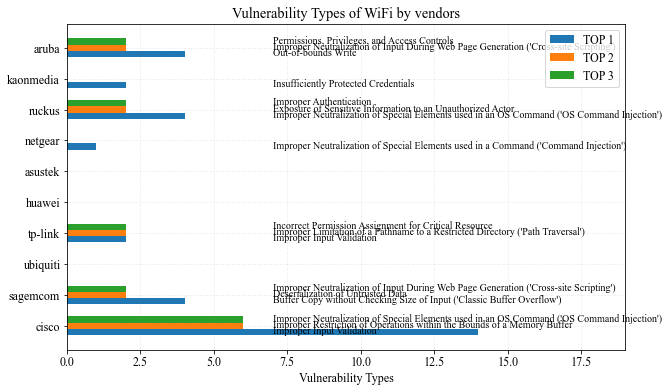

['cisco', 'sagemcom', 'ubiquiti', 'tp-link', 'huawei', 'asustek', 'netgear', 'ruckus', 'kaonmedia', 'aruba']
[10, 0, 0, 0, 0, 0, 0, 0, 0, 2]
[14, 6, 0, 11, 0, 0, 1, 8, 2, 8]
[36, 8, 0, 2, 0, 0, 0, 4, 0, 4]
[14, 4, 0, 2, 0, 0, 1, 4, 2, 4]
['CWE-20', 'CWE-120', '', 'CWE-20', '', '', 'CWE-77', 'CWE-78', 'CWE-522', 'CWE-787']


In [42]:
cvemap = {}
with open(PATH_MAP, 'r') as f:
    cvemap = json.load(f)

vendor_dict=rts
if 1:
    y_vendor_name=[]
    x_medium=[]
    x_low=[]
    x_high=[]
    
    x_num_total=[[],[]] #name,num
    x_num_type1=[[],[]] #name,num
    x_num_type2=[[],[]]
    x_num_type3=[[],[]]
    
    x_num=[] # number of every types of vulnerabilities
    for i in range(10):
        vendor=list(vendor_dict.keys())[i]
  
        vul_types=vendor_dict[vendor]['description_value'].unique()
        y_vendor_name.append(vendor)
        if vendor_dict[vendor].empty:
            x_medium.append(0)
            x_low.append(0)
            x_high.append(0)
            
            x_num.append(0)
            x_num_type1[0].append(0)
            x_num_type1[1].append("")
            x_num_type2[0].append(0)
            x_num_type2[1].append("")
            x_num_type3[0].append(0)
            x_num_type3[1].append("")
        else:
            x_medium.append((vendor_dict[vendor]['baseSeverity']=="MEDIUM").sum())
            x_low.append((vendor_dict[vendor]['baseSeverity']=="LOW").sum())
            x_high.append((vendor_dict[vendor]['baseSeverity']=="HIGH").sum())
            
            value_counts=vendor_dict[vendor][vendor_dict[vendor].isin(['NVD-CWE-Other','NVD-CWE-noinfo'])==False]['description_value'].value_counts()
            top_3_values = value_counts.head(3)
            #print("befor",x_num_type1) 
            if len(top_3_values.values)>0:
                x_num_type1[0].append(top_3_values.values[0])
                x_num_type1[1].append(str(top_3_values.index[0]))
            else:
                x_num_type1[0].append(0)
                x_num_type1[1].append("")
            if len(top_3_values.values)>1:
                x_num_type2[0].append(top_3_values.values[1])
                x_num_type2[1].append(str(top_3_values.index[1]))
            else:
                x_num_type2[0].append(0)
                x_num_type2[1].append("")
            if len(top_3_values.values)>2:
                x_num_type3[0].append(top_3_values.values[2])
                x_num_type3[1].append(str(top_3_values.index[2]))
            else:
                x_num_type3[0].append(0)
                x_num_type3[1].append("")
            #print("after",x_num_type1)      
    for i in range(8-len(y_vendor_name)):
        y_vendor_name.append("")
        x_medium.append(0)
        x_low.append(0)
        x_high.append(0)
        x_num.append(0)
        x_num_type1[0].append(0)
        x_num_type1[1].append("")
        x_num_type2[0].append(0)
        x_num_type2[1].append("")
        x_num_type3[0].append(0)
        x_num_type3[1].append("")
    
    fig, ax1 = plt.subplots(figsize=(8, 6))
    ax1.set_yticks(np.arange(len(y_vendor_name)))
    ax1.set_yticklabels(y_vendor_name) #, fontdict={'fontname': 'Times New Roman'}
    bar_height = 0.2
    bar1 = ax1.barh(np.arange(len(y_vendor_name))-bar_height, x_low, height=bar_height, label='LOW')
    bar2 = ax1.barh(np.arange(len(y_vendor_name)), x_medium, height=bar_height, label='MEDIUM')
    bar3 = ax1.barh(np.arange(len(y_vendor_name))+bar_height, x_high, height=bar_height, label='HIGH')
    
    ax1.grid(b=True, color='grey',linestyle='-.', linewidth=0.5,alpha=0.2)
    ax1.legend()
    ax1.set_xlabel('Vulnerability Severity')
    ax1.set_title('Vulnerability Severity of WiFi by vendors')
    
    plt.show()
    # ---------------- weakness types ----------------
    fig, ax2 = plt.subplots(figsize=(10, 6))
    ax2.set_yticks(np.arange(len(y_vendor_name)))
    ax2.set_yticklabels(y_vendor_name) #, fontdict={'fontname': 'Times New Roman'}
    bar_height = 0.2
    
    bar1 = ax2.barh(np.arange(len(y_vendor_name))-bar_height, x_num_type1[0], height=bar_height, label='TOP 1')
    bar2 = ax2.barh(np.arange(len(y_vendor_name)), x_num_type2[0], height=bar_height, label='TOP 2')
    bar3 = ax2.barh(np.arange(len(y_vendor_name))+bar_height, x_num_type3[0], height=bar_height, label='TOP 3')
    
    ax2.grid(b=True, color='grey',linestyle='-.', linewidth=0.5,alpha=0.2)
    ax2.legend()
    ax2.set_xlabel('Vulnerability Types')
    ax2.set_title('Vulnerability Types of WiFi by vendors')
    max_xlim=max(max(x_num_type1[0]),max(x_num_type2[0]),max(x_num_type3[0]))
    for i, v in enumerate(x_num_type1[1]):
        if v=='':
            continue
        ax2.text(max_xlim/2, i - 0.15, cvemap[v], color='black', fontsize=10, ha='left', va='center')
    for i, v in enumerate(x_num_type2[1]):
        if v=='':
            continue
        ax2.text(max_xlim/2, i + 0.05, cvemap[v], color='black', fontsize=10, ha='left', va='center')
    for i, v in enumerate(x_num_type3[1]):
        if v=='':
            continue
        ax2.text(max_xlim/2 , i + 0.25, cvemap[v], color='black', fontsize=10, ha='left', va='center')
    ax2.set_xlim([0, max(x_num_type1[0])+5])
    plt.show()
    
print(y_vendor_name)
print(x_low)
print(x_medium)
print(x_high)
print(x_num_type1[0])
print(x_num_type1[1])


[164, 414, 451]
Analyzed    890
Modified    139
Name: vulnStatus, dtype: int64
Index(['Analyzed', 'Modified'], dtype='object')
[890 139]


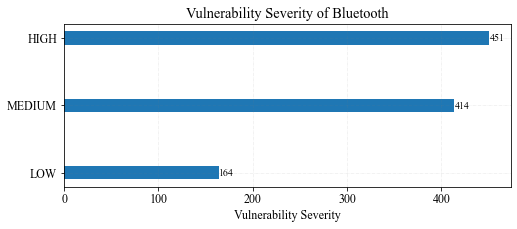

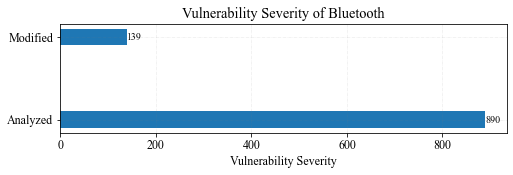

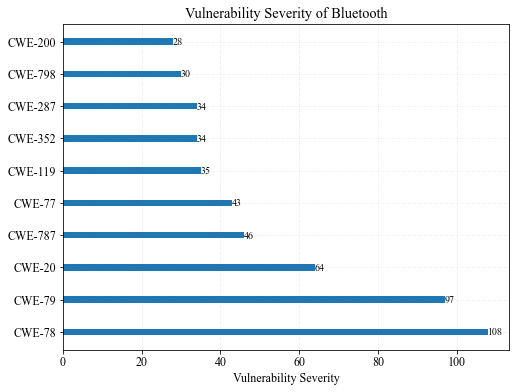

In [18]:
#------------severity-----------
y=["LOW","MEDIUM","HIGH"]
x_type=[]
for yy in y:
    x_type.append((overview['baseSeverity']==yy).sum())
print(x_type)
fig, ax = plt.subplots(figsize=(8, 3))
ax.set_yticks(np.arange(len(y)))
ax.set_yticklabels(y) #, fontdict={'fontname': 'Times New Roman'}
bar_height = 0.2
bar = ax.barh(np.arange(len(y)), x_type, height=bar_height, label='LOW')
    
ax.grid(b=True, color='grey',linestyle='-.', linewidth=0.5,alpha=0.2)
# ax.legend()
ax.set_xlabel('Vulnerability Severity')
ax.set_title('Vulnerability Severity of WiFi')
for i, v in enumerate(x_type):
    ax.text(v, i, v, color='black', fontsize=10, ha='left', va='center')
    
#------------status-----------
y_value_counts=overview['vulnStatus'].value_counts()
#top_3_values = value_counts.head(3)
print(y_value_counts)
y=y_value_counts.index
x_type=y_value_counts.values
fig, ax = plt.subplots(figsize=(8, 2))
ax.set_yticks(np.arange(len(y)))
ax.set_yticklabels(y) #, fontdict={'fontname': 'Times New Roman'}
bar_height = 0.2
print(y)
print(x_type)
bar = ax.barh(y, x_type, height=bar_height, label='LOW')
    
ax.grid(b=True, color='grey',linestyle='-.', linewidth=0.5,alpha=0.2)
# ax.legend()
ax.set_xlabel('Vulnerability Severity')
ax.set_title('Vulnerability Severity of WiFi')
for i, v in enumerate(x_type):
    ax.text(v, i, v, color='black', fontsize=10, ha='left', va='center')
    
#------------type-----------
y_value_counts=overview['description_value'][overview['description_value'].isin(['NVD-CWE-Other','NVD-CWE-noinfo'])==False].value_counts().head(10)
#top_3_values = value_counts.head(3)
#print(y_value_counts)
y=y_value_counts.index
x_type=y_value_counts.values
fig, ax = plt.subplots(figsize=(8, 6))
ax.set_yticks(np.arange(len(y)))
ax.set_yticklabels(y) #, fontdict={'fontname': 'Times New Roman'}
bar_height = 0.2
#print(y)
#print(x_type)
bar = ax.barh(y, x_type, height=bar_height, label='LOW')
    
ax.grid(b=True, color='grey',linestyle='-.', linewidth=0.5,alpha=0.2)
# ax.legend()
ax.set_xlabel('Vulnerability Severity')
ax.set_title('Vulnerability Severity of WiFi')
for i, v in enumerate(x_type):
    ax.text(v, i, v, color='black', fontsize=10, ha='left', va='center')
    

In [8]:
sql="""SELECT ssid,count(*) from(
SELECT ssid FROM wigle_wifi
UNION ALL
SELECT ssid FROM network WHERE type='W')
GROUP by ssid
ORDER by count(*) desc
LIMIT 3,10"""
rts=pd.read_sql_query(sql, con)
print(rts.to_latex())


\begin{tabular}{llr}
\toprule
{} &                    ssid &  count(*) \\
\midrule
0 &                 eduroam &      1462 \\
1 &                 default &       856 \\
2 &                  device &       733 \\
3 &               DTUsecure &       727 \\
4 &                DTUguest &       724 \\
5 &                   ZyXEL &       616 \\
6 &                wlanhome &       590 \\
7 &                 linksys &       462 \\
8 &  Skolernes Undervisning &       439 \\
9 &                     SMC &       370 \\
\bottomrule
\end{tabular}



In [ ]:
# vulnerabilities: keywords: type
keywords=["Handsfree","Smartphone","Speaker","Computer","Settop","Watch","Headphones","Desktop","CarAudio""HiFi","PDA","A/V","Palm","CordlessPhone","Monitor","Pulse","PulseOxy","Wearable","Server","Wearable","Robot","Phone","Portable Audio","Toy","HealthDisplay"]
sql_o_2="SELECT baseSeverity,cve_weaknesses.description_value,keywords,count(*) as value FROM cve_basic,cve_metrics_2,cve_weaknesses WHERE cve_basic.description_value like '%{}%' and cve_basic.id=cve_metrics_2.id and cve_basic.id=cve_weaknesses.id GROUP by baseSeverity,keywords"
sql_o_3="SELECT baseSeverity,cve_weaknesses.description_value,keywords,count(*) as value FROM cve_basic,cve_metrics_3,cve_weaknesses WHERE cve_basic.description_value like '%{}%' and cve_basic.id=cve_metrics_3.id and cve_basic.id=cve_weaknesses.id GROUP by baseSeverity,keywords"

sql_o_21="SELECT baseSeverity,cve_weaknesses.description_value as vuln_type,keywords,count(*) as value FROM cve_basic,cve_metrics_2,cve_weaknesses WHERE cve_basic.description_value like '%{}%' and cve_basic.id=cve_metrics_2.id and cve_basic.id=cve_weaknesses.id GROUP by cve_weaknesses.description_value,keywords"
sql_o_31="SELECT baseSeverity,cve_weaknesses.description_value as vuln_type,keywords,count(*) as value FROM cve_basic,cve_metrics_3,cve_weaknesses WHERE cve_basic.description_value like '%{}%' and cve_basic.id=cve_metrics_3.id and cve_basic.id=cve_weaknesses.id GROUP by cve_weaknesses.description_value,keywords"

con=sqlite3.connect(PATH)
cur=con.cursor()

low=0
medium=0
high=0
for keyword in keywords:
    sql_2=sql_o_2.format(keyword)
    df_2=pd.read_sql_query(sql_2, con)
    for index, row in df_2.iterrows():
        df_2["types"].append(keywords)
    fig = px.sunburst(df, path=['keywords', 'vendors', 'baseSeverity'], values='value')
    fig.show()
#     uni_v = rts_2['keywords'].unique()
#     number_of_type=len(uni_v)
    
#     for i in len(uni_v):
#         df_2.loc[i]=[keywords,uni_v[i],'LOW',low]
#         df_2.loc[i]=[keywords,uni_v[i],'MEDIUM',medium]
#         df_2.loc[i]=[keywords,uni_v[i],'HIGH',high]
        
#     fig = px.sunburst(df, path=['types', 'vendors', 'scores'], values='value')
#     fig.show()

#     sql_3=sql_o_3.format(keyword)
#     rts_3=pd.read_sql_query(sql_3, con)
    sql_3=sql_o_3.format(keyword)
    df_3=pd.read_sql_query(sql_3, con)
    for index, row in df_3.iterrows():
        df_3["types"].append(keywords)
    fig = px.sunburst(df, path=['keywords', 'vendors', 'baseSeverity'], values='value')
    fig.show()
    
    sql=sql_o_21.format(keyword)
    df_21=pd.read_sql_query(sql, con)
    for index, row in df_21.iterrows():
        df_21["types"].append(keywords)
    fig = px.sunburst(df, path=['keywords', 'vendors', 'vuln_type'], values='value')
    fig.show()
    
    sql=sql_o_31.format(keyword)
    df_31=pd.read_sql_query(sql, con)
    for index, row in df_3.iterrows():
        df_31["types"].append(keywords)
    fig = px.sunburst(df, path=['keywords', 'vendors', 'vuln_type'], values='value')
    fig.show()
con.close()

In [ ]:
sql_o_31="SELECT baseSeverity,cve_weaknesses.description_value as vuln_type,keywords,count(*) as value FROM cve_basic,cve_metrics_3,cve_weaknesses WHERE cve_basic.description_value like '%wifi%' and cve_basic.id=cve_metrics_3.id and cve_basic.id=cve_weaknesses.id GROUP by cve_weaknesses.description_value,keywords"

con=sqlite3.connect(PATH)
cur=con.cursor()

low=0
medium=0
high=0
for keyword in keywords:
    sql_2=sql_o_2.format(keyword)
    df_2=pd.read_sql_query(sql_2, con)
    for index, row in df_2.iterrows():
        df_2["types"].append(keywords)
    fig = px.sunburst(df, path=['keywords', 'vendors', 'baseSeverity'], values='value')
    fig.show()

con.close()

In [5]:
def pic_serverity(df,me,hi,wi):
    severity_levels = ['LOW', 'MEDIUM', 'HIGH','CRITICAL']
    df_filtered = df[df['baseSeverity'].isin(severity_levels)]

    # Create a horizontal bar chart
    fig = go.Figure()
    for severity in severity_levels:
        filtered_data = df_filtered[df_filtered['baseSeverity'] == severity]
        if len(filtered_data) > 0:  # Check if severity level has any data
            fig.add_trace(go.Bar(
                y=filtered_data['vendors'],
                x=filtered_data['tc'],
                text=filtered_data['tc'],
                textposition='inside',
                name=severity.upper(),
                orientation='h',
                #base=[1] * len(filtered_data['vendors'])
            ))
    # Customize the layout
    s="The number of vulnerability by risk level"
    fig.update_layout(
        #title='Vendor Counts by Severity Level',
        #xaxis_title=s,
        yaxis_title='Vendors',
        barmode='stack',
        bargap=0.1,
        width=wi,  # Specify the desired width of the figure
        height=hi,
        xaxis=dict(
            #showticklabels=False,
    type='log',  # Set x-axis to logarithmic scale
    title=s,
              # Specify the desired height of the figure
    #'visible': True,
    
), autosize=True
    )
    # Show the plot
    fig.show()


        vendors baseSeverity  tc              id
0          ieee       MEDIUM   4  CVE-2021-27854
1         intel         HIGH  28  CVE-2022-21181
2         intel          LOW   2  CVE-2021-23188
3         intel       MEDIUM  30  CVE-2021-44545
4        ip-com     CRITICAL   1  CVE-2022-45721
5       netgear     CRITICAL   5  CVE-2023-27852
6       netgear         HIGH  10  CVE-2023-28338
7       netgear       MEDIUM   3  CVE-2023-27850
8          roku       MEDIUM   2  CVE-2022-27152
9         tenda     CRITICAL   4  CVE-2023-27012
10     trendnet     CRITICAL   2  CVE-2022-46584
11          zte       MEDIUM   1  CVE-2022-39067
12        zyxel       MEDIUM   2  CVE-2022-45439
0       airties     CRITICAL   2  CVE-2022-38789
1        d-link     CRITICAL   3  CVE-2023-24351
2         intel         HIGH   8   CVE-2021-0164
3         intel       MEDIUM  38   CVE-2021-0167
4      mediatek         HIGH  36  CVE-2021-32467
5       netgear       MEDIUM   1  CVE-2022-47052
6      nintendo     

     vendors vuln_type  tc              id
0       ieee   CWE-130   2  CVE-2021-27862
1       ieee   CWE-290   4  CVE-2021-27854
2      intel   CWE-119   2  CVE-2022-21160
3      intel   CWE-125   6  CVE-2021-23168
4      intel    CWE-20  25   CVE-2021-0063
5      intel   CWE-276   2   CVE-2021-0065
6      intel   CWE-326   2  CVE-2022-21139
7      intel   CWE-427   2   CVE-2021-0082
8      intel   CWE-665   4   CVE-2021-0053
9      intel   CWE-732   4   CVE-2021-0064
10     intel   CWE-787   5   CVE-2021-0075
11     intel   CWE-863   6  CVE-2021-23188
12    ip-com   CWE-120   1  CVE-2022-45721
13   netgear   CWE-120   2  CVE-2023-27852
14   netgear   CWE-352   1   CVE-2023-1205
15   netgear   CWE-354   4  CVE-2022-38955
16   netgear   CWE-434   1  CVE-2023-28337
17   netgear   CWE-494   1  CVE-2023-23110
18   netgear   CWE-770   1  CVE-2023-28338
19   netgear   CWE-787   5  CVE-2022-37234
20     tenda   CWE-787   4  CVE-2023-25214
21  trendnet   CWE-787   2  CVE-2022-46580
22       zt

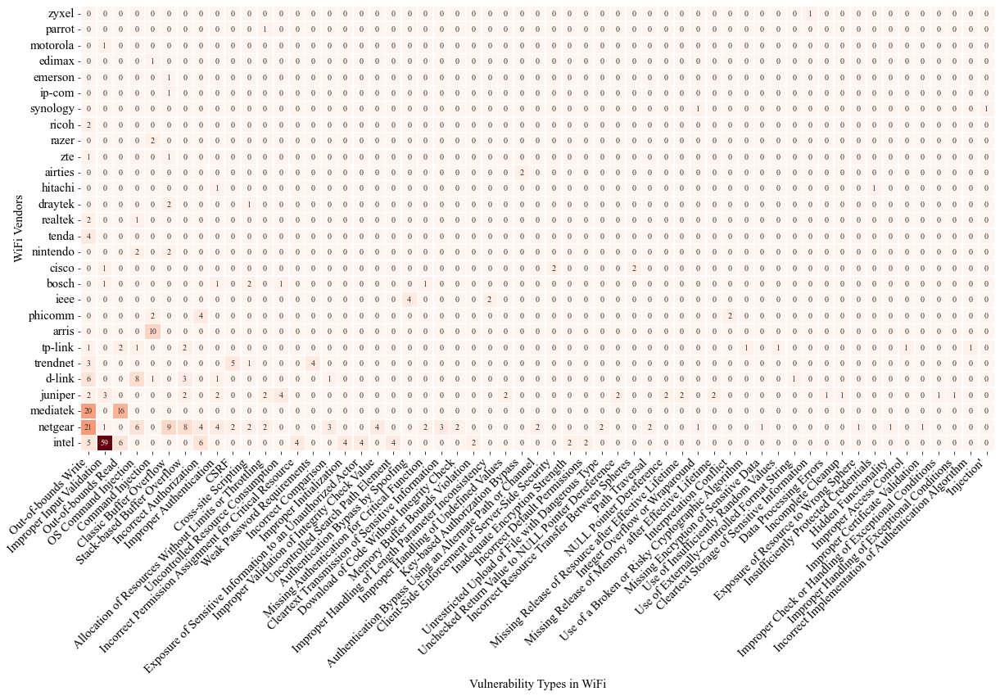

In [60]:
con=sqlite3.connect(PATH)
cur=con.cursor()

sql1="""SELECT keywords, baseSeverity, count(*) 
from cve_basic,cve_metrics_2 
WHERE cve_basic.keywords='{}' 
and cve_basic.description_value like '%{}%' 
and cve_metrics_2.id=cve_basic.id
GROUP by keywords,baseSeverity"""

sql0="""SELECT keywords AS vendors,count(*) AS tc
        from cve_basic
        WHERE (cve_basic.id like '%-2022-%' or cve_basic.id like '%-2023-%' or cve_basic.id like '%-2021-%')
        AND cve_basic.description_value like '%{}%' COLLATE NOCASE
        GROUP BY vendors"""

#for typ in types:
sql02="""SELECT distinct cve_basic.id,keywords AS vendors, baseSeverity,count(*) AS tc
        from cve_metrics_2,cve_basic
        WHERE cve_basic.id=cve_metrics_2.id 
        AND (cve_basic.id like '%-2022-%' or cve_basic.id like '%-2023-%' or cve_basic.id like '%-2021-%')
        AND cve_basic.description_value like '%{}%' COLLATE NOCASE
        GROUP BY vendors"""

sql03="""SELECT  distinct cve_basic.id,keywords AS vendors, baseSeverity,count(*) AS tc
        from cve_metrics_3,cve_basic
        WHERE cve_basic.id=cve_metrics_3.id 
        AND (cve_basic.id like '%-2022-%' or cve_basic.id like '%-2023-%' or cve_basic.id like '%-2021-%')
        AND cve_basic.description_value like '%{}%' COLLATE NOCASE
        GROUP BY vendors, baseSeverity"""

sql021="""SELECT  distinct cve_basic.id,keywords AS vendors, cve_weaknesses.description_value as vuln_type, COUNT(*) AS tc
        from cve_weaknesses,cve_basic
        WHERE cve_basic.id=cve_weaknesses.id 
        AND (cve_basic.id like '%-2022-%' or cve_basic.id like '%-2023-%' or cve_basic.id like '%-2021-%')
        AND cve_basic.description_value like '%{}%' COLLATE NOCASE
        AND cve_weaknesses.description_value!='NVD-CWE-Other'
        AND cve_weaknesses.description_value!='NVD-CWE-noinfo'
        GROUP BY vendors, cve_weaknesses.description_value"""

df_0=pd.DataFrame(columns=['vendors', 'tc'])
df_2=pd.DataFrame(columns=['vendors', 'baseSeverity', 'tc'])
df_3=pd.DataFrame(columns=['vendors', 'baseSeverity', 'tc'])
df_21=pd.DataFrame(columns=['vendors', 'vuln_type', 'tc'])

for key in keywords:
    sql=sql0.format(key)
    rts=pd.read_sql_query(sql, con)
    df_0=pd.concat([df_0,rts],axis=0)
    #print(rts)
    
#     sql=sql02.format(key)
#     rts=pd.read_sql_query(sql, con)
#     df_2=pd.concat([df_2,rts],axis=0)
    #print(rts)
    
    sql=sql03.format(key)
    rts=pd.read_sql_query(sql, con)
    df_3=pd.concat([df_3,rts],axis=0)
    
    sql=sql021.format(key)
    rts=pd.read_sql_query(sql, con)
    df_21=pd.concat([df_21,rts],axis=0)



# fig.show()
width =  1000
height = 600
# print(df_2)
# print("**2*********")
# pic_serverity(df_2,"metrics 2",600,800)

print(df_3)

df_3 = df_3.groupby(['vendors', 'baseSeverity']).sum().reset_index()

#df_3=align_vendor_names(df_3)
print("**3*********")
pic_serverity(df_3,"metrics 3",800,800)

fig = px.pie(df_3, names='baseSeverity', values='tc',title='Base Severity Distribution')
fig.update_traces(textinfo="label+value+percent", textfont=dict(size=20))
fig.update_layout(width=width, height=height)
fig.show()

# fig = px.pie(df_3, names='baseSeverity', values='tc',title='Base Severity Distribution')
# fig.update_traces(textinfo="label+value", textfont=dict(size=25))
# fig.update_layout(width=width, height=height)
# fig.show()


print(df_21)

df_21['tc'] = df_21['tc'].astype(int)
df_21['vuln_type'] = df_21['vuln_type'].map(cvemap)
print("we have {} vulnerabilities".format(df_21['vuln_type'].unique().shape))

# Sort vuln_type based on the sum of values in each category
sorted_vulns = df_21.groupby('vuln_type')['tc'].sum().sort_values(ascending=False)
#top_half_vulns = sorted_vulns[:22]  # Select the top 22 vuln_type categories

# Filter the DataFrame based on the top half vuln_type categories
top_half_df = df_21[df_21['vuln_type'].isin(sorted_vulns.index)]
#print(top_half_vulns)

# Create a pivot table with vendors as index, vuln_type as columns, and tc as values
heatmap_top = top_half_df.pivot_table(index='vendors', columns='vuln_type', values='tc', aggfunc='sum', fill_value=0)
heatmap_top = heatmap_top[sorted_vulns.index]


# Sort vendors based on the sum of tc values and reorder the pivot table accordingly
vendor_sums = top_half_df.groupby('vendors')['tc'].sum()
sorted_vendors = vendor_sums.sort_values().index
heatmap_top = heatmap_top.reindex(sorted_vendors)
heatmap_top= heatmap_top[sorted_vulns.index]
# Replace any infinity or NaN values with 0 and round the values to integers
heatmap_top = heatmap_top.replace([np.inf, -np.inf, np.nan], 0)
heatmap_top = heatmap_top.round().astype(int)

# Rename specific vuln_type categories for better readability on the heatmap
heatmap_top = heatmap_top.rename(columns={'Improper Restriction of Operations within the Bounds of a Memory Buffer': 'Memory Buffer Bounds Violation',
                                         'Authorization Bypass Through User-Controlled Key':'Key-based Authorization Bypass'})



fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(heatmap_top, cmap='Reds', annot=True, fmt='d', linewidths=0.5, ax=ax, annot_kws={'fontsize': 10},cbar=False)
ax.set_xticklabels(heatmap_top.columns, rotation=45, ha='right', fontsize=15)
ax.set_yticklabels(heatmap_top.index, rotation=0, fontsize=15)
ax.set_xlabel('Vulnerability Types in WiFi', fontsize=15)
ax.set_ylabel('WiFi Vendors', fontsize=15)

#ax.vlines([5,11,14,18,20,21], *ax.get_ylim(),colors='black', linewidths=2)

# Print the LaTeX table
#print(latex_table)
plt.savefig('heatmap_wifi_half.png', dpi=300, bbox_inches='tight')

                                     OrganizationName  count(*)
0                                              3COM\n        86
1                         7INOVA TECHNOLOGY LIMITED\n         1
2                           ACCTON TECHNOLOGY CORP.\n         1
3                                ALPSALPINE CO,.LTD\n         1
4                                 ARRIS Group, Inc.\n         2
5                             ASUSTek COMPUTER INC.\n         4
6                                          AVM GmbH\n        17
7                                 Aceex Corporation\n        12
8                                 Acer Incorporated\n        17
9                                     Agere Systems\n       230
10                              Air Link Technology\n         5
11                        AirTies Wireless Networks\n         2
12                         Allied Data Technologies\n         1
13                   Ambit Microsystems Corporation\n        22
14                                      

vuln_type
Improper Input Validation                                                  61
Out-of-bounds Write                                                        36
OS Command Injection                                                       14
Stack-based Buffer Overflow                                                11
Command Injection                                                          11
Incorrect Authorization                                                    10
Classic Buffer Overflow                                                     9
Out-of-bounds Read                                                          6
Improper Authentication                                                     5
Uncontrolled Search Path Element                                            4
Improper Initialization                                                     4
Improper Validation of Integrity Check Value                                4
Exposure of Sensitive Information to an Unauthorized A

vuln_type
Improper Input Validation                                                  60
Out-of-bounds Write                                                        11
OS Command Injection                                                        8
Out-of-bounds Read                                                          6
Incorrect Authorization                                                     6
Exposure of Sensitive Information to an Unauthorized Actor                  4
Incorrect Permission Assignment for Critical Resource                       4
Uncontrolled Search Path Element                                            4
Improper Initialization                                                     4
Stack-based Buffer Overflow                                                 3
Client-Side Enforcement of Server-Side Security                             2
Incorrect Resource Transfer Between Spheres                                 2
Incorrect Default Permissions                         

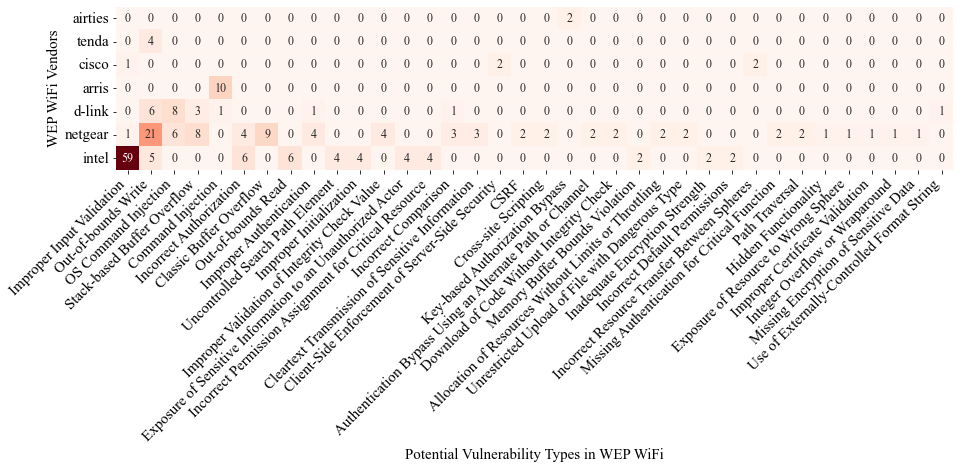

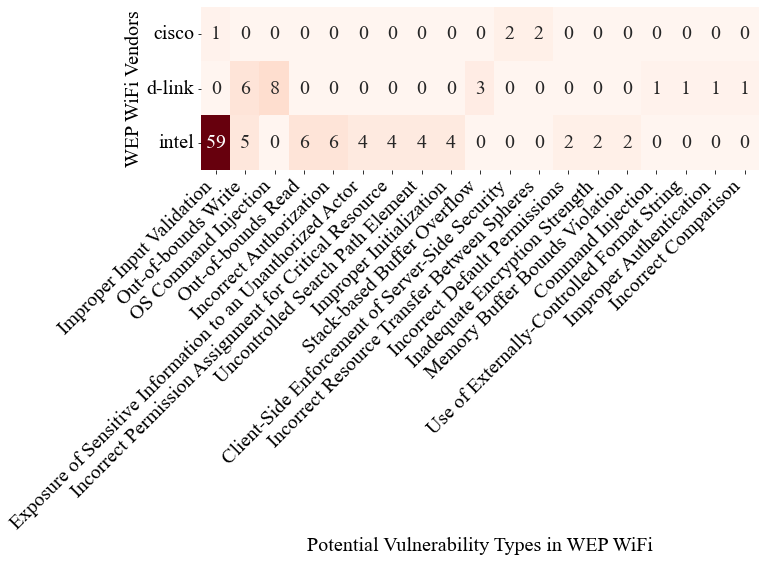

In [55]:
sql="""SELECT Distinct OrganizationName, count(*) from(
SELECT OrganizationName from wigle_wifi, vendor 
WHERE encryption = 'wep'
AND wigle_wifi.netid=vendor.mac
UNION ALL 
SELECT OrganizationName from network, vendor 
WHERE network.type='W'
AND network.capabilities like '%WEP%'
AND network.bssid=vendor.mac
)
GROUP by OrganizationName"""
rts=pd.read_sql_query(sql, con)
#print(rts.to_latex())
print(rts)
rts_0=set(clean_name(rts['OrganizationName']))
print("********CLEANED NAME*********\n",len(rts_0),rts_0)
selected_vendors=set(df_21['vendors']).intersection(rts_0)
print("selected_vendors:\n",selected_vendors)

#selected_vendors = ['intel', 'netgear', 'tenda', 'cisco', 'd-link']
filtered_df = df_21[df_21['vendors'].isin(selected_vendors)]
filtered_df_3 = df_3[df_3['vendors'].isin(selected_vendors)]
pic_serverity(filtered_df_3,"metrics 3",300,800)
# Aggregate the 'tc' values using the mean
agg_df = filtered_df.groupby(['vendors', 'vuln_type'])['tc'].sum().reset_index()

# Pivot the DataFrame to create a matrix
heatmap_data = agg_df.pivot(index='vendors', columns='vuln_type', values='tc')

vuln_type_sums = agg_df.groupby('vuln_type')['tc'].sum().sort_values(ascending=False)
print(vuln_type_sums)
sorted_vendors = vuln_type_sums.index
heatmap_data = heatmap_data[sorted_vendors]

heatmap_data = heatmap_data.rename(columns={'Improper Restriction of Operations within the Bounds of a Memory Buffer': 'Memory Buffer Bounds Violation',
                                         'Authorization Bypass Through User-Controlled Key':'Key-based Authorization Bypass'})

vendor_sums = agg_df.groupby('vendors')['tc'].sum()
sorted_vendors = vendor_sums.sort_values().index
heatmap_data = heatmap_data.reindex(sorted_vendors)
heatmap_data = heatmap_data.replace([np.inf, -np.inf, np.nan], 0)
heatmap_data = heatmap_data.round().astype(int)

# Generate the heatmap
fig, ax = plt.subplots(figsize=(15,3))
sns.heatmap(heatmap_data, annot=True, cmap='Reds',cbar=False)
ax.set_xticklabels(heatmap_data.columns, rotation=45, ha='right', fontsize=15)
ax.set_yticklabels(heatmap_data.index, rotation=0, fontsize=15)
ax.set_xlabel('Potential Vulnerability Types in WEP WiFi', fontsize=15)
ax.set_ylabel('WEP WiFi Vendors', fontsize=15)
plt.savefig('heatmap_wep.png', dpi=300, bbox_inches='tight')


##########OPEN
sql="select Distinct OrganizationName, count(*) from wigle_wifi,vendor where encryption='none' and wigle_wifi.netid=vendor.mac group by OrganizationName order by count(*) desc"
rts=pd.read_sql_query(sql, con)
#print(rts.to_latex())
print(rts)
rts_0=set(clean_name(rts['OrganizationName']))
print("********CLEANED NAME*********\n",len(rts_0),rts_0)
selected_vendors=set(df_21['vendors']).intersection(rts_0)
print("selected_vendors:\n",selected_vendors)

#selected_vendors = ['intel', 'cisco', 'd-link']
filtered_df = df_21[df_21['vendors'].isin(selected_vendors)]
filtered_df_3 = df_3[df_3['vendors'].isin(selected_vendors)]
pic_serverity(filtered_df_3,"metrics 2",280,800)
# Aggregate the 'tc' values using the mean
agg_df = filtered_df.groupby(['vendors', 'vuln_type'])['tc'].sum().reset_index()


# Pivot the DataFrame to create a matrix
heatmap_data = agg_df.pivot(index='vendors', columns='vuln_type', values='tc')

vuln_type_sums = agg_df.groupby('vuln_type')['tc'].sum().sort_values(ascending=False)
print(vuln_type_sums)
sorted_vendors = vuln_type_sums.index
heatmap_data = heatmap_data[sorted_vendors]

heatmap_data = heatmap_data.rename(columns={'Improper Restriction of Operations within the Bounds of a Memory Buffer': 'Memory Buffer Bounds Violation',
                                         'Authorization Bypass Through User-Controlled Key':'Key-based Authorization Bypass'})

vendor_sums = agg_df.groupby('vendors')['tc'].sum()
sorted_vendors = vendor_sums.sort_values().index
heatmap_data = heatmap_data.reindex(sorted_vendors)
heatmap_data = heatmap_data.replace([np.inf, -np.inf, np.nan], 0)
heatmap_data = heatmap_data.round().astype(int)

# Generate the heatmap
fig, ax = plt.subplots(figsize=(10,3))
sns.heatmap(heatmap_data, annot=True, cmap='Reds',cbar=False,annot_kws={'fontsize': 20})
ax.set_xticklabels(heatmap_data.columns, rotation=45, ha='right', fontsize=20)
ax.set_yticklabels(heatmap_data.index, rotation=0, fontsize=20)
ax.set_xlabel('Potential Vulnerability Types in WEP WiFi', fontsize=20)
ax.set_ylabel('WEP WiFi Vendors', fontsize=20)
plt.savefig('heatmap_open.png', dpi=300, bbox_inches='tight')

# open wifi

In [30]:
con=sqlite3.connect(PATH)
cur=con.cursor()

sql="select Distinct OrganizationName, count(*) from wigle_wifi,vendor where encryption='none' and wigle_wifi.netid=vendor.mac group by OrganizationName order by count(*) desc"

rts=pd.read_sql_query(sql, con)
print(rts.to_latex())
print(rts)
rts_0=set(clean_name(rts['OrganizationName']))
print("********CLEANED NAME*********\n",len(rts_0),rts_0)

rts_0_vuln=set(df_21['vendors']).intersection(rts_0)

# Data
df = rts.sort_values(by='count(*)', ascending=False)

# Get the top 10 organizations
top_10 = df.head(10)

# Calculate the sum of counts for the remaining organizations
others_count = df['count(*)'][10:].sum()

# Combine the remaining organizations as 'Others'
others = pd.DataFrame({
    'OrganizationName': ['Others'],
    'count(*)': [others_count]
})

# Concatenate the top 10 organizations and 'Others'
combined_df = pd.concat([top_10, others])

# Plot the pie chart
fig = px.pie(combined_df, values='count(*)', names='OrganizationName', title='Top 10 Organizations (Others Combined)')

# Update the layout to position the legend at the top right corner
fig.update_layout(
    legend=dict(x=1, y=0.5),
    autosize=False,
    width=600,
    height=500
)

fig.show()



\begin{tabular}{llr}
\toprule
{} &                                   OrganizationName &  count(*) \\
\midrule
0  &                      Global Sun Technology, Inc.\textbackslash n &      1017 \\
1  &                      ZyGate Communications, Inc.\textbackslash n &       457 \\
2  &                          The Linksys Group, Inc.\textbackslash n &       378 \\
3  &                                    Agere Systems\textbackslash n &       355 \\
4  &                               SMC Networks, Inc.\textbackslash n &       330 \\
5  &                                Intel Corporation\textbackslash n &       270 \\
6  &                   Ambit Microsystems Corporation\textbackslash n &       245 \\
7  &                       Billion Electric Co., Ltd.\textbackslash n &       206 \\
8  &                          CC\&C Technologies, Inc.\textbackslash n &       172 \\
9  &                                   Ericsson Group\textbackslash n &       153 \\
10 &                                Col

In [27]:
import sqlite3

def generate_latex_table(data):
    table_header = "\\begin{table}[ht]\n"
    table_header += "\\centering\n"
    table_header += "\\begin{tabular}{|c|c|c|c|}\n"
    table_header += "\\hline\n"
    table_header += "SSID & Count & SSID & Count\\\\\n"
    table_header += "\\hline\n"

    table_footer = "\\hline\n"
    table_footer += "\\end{tabular}\n"
    table_footer += "\\end{table}"

    table_body = ""
    for i in range(len(data)//2):
        # print(len(data))
        ssid1, count1 = data[i]
        ssid2, count2 = data[i + len(data)//2]
        table_body += f"{ssid1} & {count1} & {ssid2} & {count2}\\\\\n\\hline\n"

    latex_table = table_header + table_body + table_footer
    return latex_table

# Connect to the SQLite database
conn = sqlite3.connect(PATH)
cursor = conn.cursor()

# Execute the SQL query
cursor.execute("""select  ssid, count(*) FROM(
SELECT ssid from network,vendor
WHERE network.type='W'
AND network.bssid = vendor.mac
UNION ALL
SELECT ssid from wigle_wifi,vendor
WHERE wigle_wifi.netid= vendor.mac
)
group by ssid
ORDER by count(*) desc""")

# Fetch all the rows
data = cursor.fetchall()

# Duplicate the data for repeated columns

# Generate LaTeX table
latex_table = generate_latex_table(data)

# Print the LaTeX table
print(latex_table)

# Close the database connection
conn.close()


\begin{table}[ht]
\centering
\begin{tabular}{|c|c|c|c|}
\hline
SSID & Count & SSID & Count\\
\hline
None & 5229 & TP-Link_A674_5G & 1\\
\hline
 & 3122 & TP-Link_A4BE_5G & 1\\
\hline
<no ssid> & 1952 & TP-Link_A486_5G & 1\\
\hline
eduroam & 1168 & TP-Link_A486 & 1\\
\hline
default & 778 & TP-Link_A308 & 1\\
\hline
device & 730 & TP-Link_A2FE_5G & 1\\
\hline
DTUsecure & 726 & TP-Link_A2FE & 1\\
\hline
DTUguest & 720 & TP-Link_A283_5G & 1\\
\hline
ZyXEL & 543 & TP-Link_A283 & 1\\
\hline
linksys & 443 & TP-Link_A213 & 1\\
\hline
SMC & 366 & TP-Link_A19F_5G & 1\\
\hline
Fullrate & 350 & TP-Link_A19F & 1\\
\hline
.DSB_Wi-Fi & 336 & TP-Link_A018 & 1\\
\hline
Tilgin-602 & 263 & TP-Link_9F95_5G & 1\\
\hline
Wireless & 244 & TP-Link_9F95 & 1\\
\hline
Perspektiv Bredband & 238 & TP-Link_9F5D_5G & 1\\
\hline
wireless & 226 & TP-Link_9EEC & 1\\
\hline
Tilgin-601 & 213 & TP-Link_9E9B_5G & 1\\
\hline
FF-BYEN & 200 & TP-Link_9D71 & 1\\
\hline
MyWLAN & 159 & TP-Link_9CA6_5G & 1\\
\hline
WLAN Zone - The

In [34]:
con=sqlite3.connect(PATH)
cur=con.cursor()
print(rts_0_vuln)
sql1="""SELECT keywords, baseSeverity, count(*) 
from cve_basic,cve_metrics_2 
WHERE cve_basic.keywords='{}' 
and cve_basic.description_value like '%{}%' 
and cve_metrics_2.id=cve_basic.id
GROUP by keywords,baseSeverity"""

sql0="""SELECT keywords AS vendors,count(*) AS tc
        from cve_basic
        WHERE (cve_basic.id like '%-2022-%' or cve_basic.id like '%-2023-%' or cve_basic.id like '%-2021-%')
        AND cve_basic.description_value like '%{}%' COLLATE NOCASE
        AND cve_basic.keywords='{}'
        GROUP BY vendors"""

#for typ in types:
sql02="""SELECT keywords AS vendors, baseSeverity,count(*) AS tc
        from cve_metrics_2,cve_basic
        WHERE cve_basic.id=cve_metrics_2.id 
        AND (cve_basic.id like '%-2022-%' or cve_basic.id like '%-2023-%' or cve_basic.id like '%-2021-%')
        AND cve_basic.description_value like '%{}%' COLLATE NOCASE
        AND cve_basic.keywords='{}'
        GROUP BY vendors"""

sql03="""SELECT keywords AS vendors, baseSeverity,count(*) AS tc
        from cve_metrics_3,cve_basic
        WHERE cve_basic.id=cve_metrics_3.id 
        AND (cve_basic.id like '%-2022-%' or cve_basic.id like '%-2023-%' or cve_basic.id like '%-2021-%')
        AND cve_basic.description_value like '%{}%' COLLATE NOCASE
        AND cve_basic.keywords='{}'
        GROUP BY vendors, baseSeverity"""

sql021="""SELECT keywords AS vendors, cve_weaknesses.description_value as vuln_type, COUNT(*) AS tc
        from cve_weaknesses,cve_basic
        WHERE cve_basic.id=cve_weaknesses.id 
        AND (cve_basic.id like '%-2022-%' or cve_basic.id like '%-2023-%' or cve_basic.id like '%-2021-%')
        AND cve_basic.description_value like '%{}%' COLLATE NOCASE
        AND cve_weaknesses.description_value!='NVD-CWE-Other'
        AND cve_weaknesses.description_value!='NVD-CWE-noinfo'
        AND cve_basic.keywords='{}'
        GROUP BY vendors, cve_weaknesses.description_value"""

df_0=pd.DataFrame(columns=['vendors', 'tc'])
df_2=pd.DataFrame(columns=['vendors', 'baseSeverity', 'tc'])
df_3=pd.DataFrame(columns=['vendors', 'baseSeverity', 'tc'])
df_21=pd.DataFrame(columns=['vendors', 'vuln_type', 'tc'])

for key in keywords:
    for vendor in rts_0_vuln:
        sql=sql0.format(key,vendor)
        rts=pd.read_sql_query(sql, con)
        df_0=pd.concat([df_0,rts],axis=0)
        #print(rts)

#         sql=sql02.format(key,vendor)
#         rts=pd.read_sql_query(sql, con)
#         df_2=pd.concat([df_2,rts],axis=0)
        #print(rts)

        sql=sql03.format(key,vendor)
        rts=pd.read_sql_query(sql, con)
        df_3=pd.concat([df_3,rts],axis=0)

        sql=sql021.format(key,vendor)
        rts=pd.read_sql_query(sql, con)
        df_21=pd.concat([df_21,rts],axis=0)

categories = df_0['vendors']
values = df_0['tc']
df_2 = df_2.groupby(['vendors', 'baseSeverity']).sum().reset_index()
# Create a horizontal bar chart with automatic colors and vertical text inside the bars
fig = go.Figure(data=go.Bar(
    x=values,
    y=categories,
    orientation='h',
    marker=dict(color=values, coloraxis='coloraxis'),  # Assign colors based on values
    text=values,  # Set the text attribute to display numbers
    textposition='inside',  # Set the position of the numbers inside the bars
    insidetextfont=dict(size=10, color='white', family='Arial')  # Customize the text font and angle
))

# Update layout
fig.update_layout(
    yaxis_title='Vendors',
    barmode='stack',
    bargap=0.1,
    xaxis=dict(type='log'),  # Set x-axis to logarithmic scale
    autosize=True,
    coloraxis=dict(colorscale='Viridis')  # Set the color scale
)

fig.show()

# print(df_2)
# print("**2*********")
# pic_serverity(df_2,"metrics 2",250,800)



{'cisco', 'd-link', 'intel'}


  vendors baseSeverity  tc
0   intel         HIGH  28
1   intel          LOW   2
2   intel       MEDIUM  30
0  d-link     CRITICAL   3
0   intel         HIGH   8
1   intel       MEDIUM  38
0   cisco     CRITICAL   4
0   cisco         HIGH   1
1   cisco       MEDIUM   1
0  d-link     CRITICAL   3
1  d-link         HIGH   8
2  d-link       MEDIUM  22
group df_3
   vendors baseSeverity  tc
0   cisco     CRITICAL   4
1   cisco         HIGH   1
2   cisco       MEDIUM   1
3  d-link     CRITICAL   6
4  d-link         HIGH   8
5  d-link       MEDIUM  22
6   intel         HIGH  36
7   intel          LOW   2
8   intel       MEDIUM  68
**3*********


  vendors vuln_type  tc
0   intel   CWE-119   2
1   intel   CWE-125   6
2   intel    CWE-20  25
3   intel   CWE-276   2
4   intel   CWE-326   2
5   intel   CWE-427   2
6   intel   CWE-665   4
7   intel   CWE-732   4
8   intel   CWE-787   5
9   intel   CWE-863   6
0  d-link   CWE-787   3
0   intel    CWE-20  34
1   intel   CWE-200   4
2   intel   CWE-427   2
0   cisco   CWE-602   2
1   cisco   CWE-669   2
0   cisco    CWE-20   1
0  d-link   CWE-121   3
1  d-link   CWE-134   1
2  d-link   CWE-287   1
3  d-link   CWE-697   1
4  d-link    CWE-77   1
5  d-link    CWE-78   8
6  d-link   CWE-787   3
0    NaN
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
7    NaN
8    NaN
9    NaN
0    NaN
0    NaN
1    NaN
2    NaN
0    NaN
1    NaN
0    NaN
0    NaN
1    NaN
2    NaN
3    NaN
4    NaN
5    NaN
6    NaN
Name: vuln_type, dtype: object


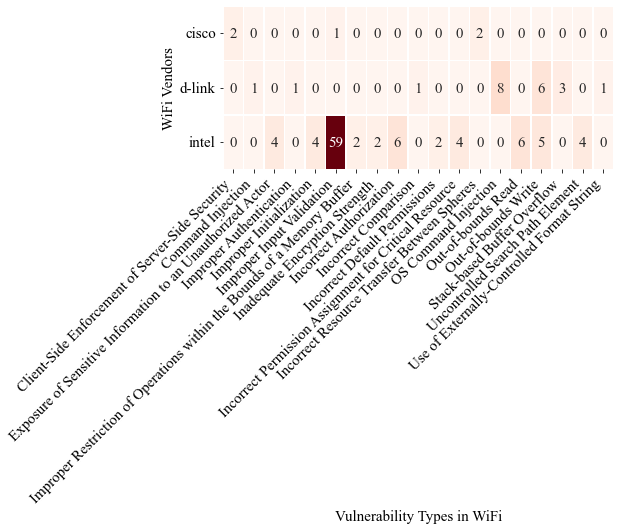

In [35]:
print(df_3)

df_3 = df_3.groupby(['vendors', 'baseSeverity']).sum().reset_index()
print("group df_3\n",df_3)
#df_3=align_vendor_names(df_3)
print("**3*********")
pic_serverity(df_3,"metrics 3",260,800)

print(df_21)

df_21['tc'] = df_21['tc'].astype(int)

df_21['vuln_type'] = df_21['vuln_type'].map(cvemap)
pivot_table = df_21.pivot_table(index='vendors', columns='vuln_type', values='tc', aggfunc='sum', fill_value=0)

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(7, 3))

vendor_sums = df_21.groupby('vendors')['tc'].sum()
sorted_vendors = vendor_sums.sort_values().index
pivot_table = pivot_table.reindex(sorted_vendors)
pivot_table = pivot_table.replace([np.inf, -np.inf, np.nan], 0)
pivot_table = pivot_table.round().astype(int)

pivot_table = pivot_table.rename(columns={'Improper Restriction of Operations within the Bounds of a Memory Buffer': 'Memory Buffer Bounds Violation',
                                         'Authorization Bypass Through User-Controlled Key':'Key-based Authorization Bypass'})



sns.heatmap(pivot_table, cmap='Reds', annot=True, fmt='d', linewidths=0.5, ax=ax, annot_kws={'fontsize': 15},cbar=False)
ax.set_xticklabels(pivot_table.columns, rotation=45, ha='right', fontsize=15)
ax.set_yticklabels(pivot_table.index, rotation=0, fontsize=15)
ax.set_xlabel('Vulnerability Types in WiFi', fontsize=15)
ax.set_ylabel('WiFi Vendors', fontsize=15)

#ax.vlines([5,11,14,18,20,21], *ax.get_ylim(),colors='black', linewidths=2)

print(df_21['vuln_type'].map(cvemap))
# Print the LaTeX table
#print(latex_table)
plt.savefig('heatmap_open.png', dpi=300, bbox_inches='tight')